# **Libraries and frameworks**

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
pd.set_option('display.max_rows',100)


# **Data Pre Analysis**

In [2]:
data=pd.read_csv("/content/Reviewsfinal.csv")
data.head()

,Rating,Review_title,Review_body
0,1.0,Worthless,Very slow this watch. I cannot return this pro...
1,4.0,Nice product,Watch is good only i feel that sound can be mo...
2,5.0,Best in the market!,The product is very good in design....and valu...
3,5.0,Perfect product!,Nice
4,5.0,Great product,"Is so good and light weight and comfort, this ..."


In [3]:
reviews=data.copy()

In [4]:
data.shape

(3211, 3)

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3211 entries, 0 to 3210
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Rating        3211 non-null   float64
 1   Review_title  3211 non-null   object 
 2   Review_body   3211 non-null   object 
dtypes: float64(1), object(2)
memory usage: 75.4+ KB


In [6]:
data.describe(include='all')

,Rating,Review_title,Review_body
count,3211.000000,3211,3211
unique,NaN,57,2705
top,NaN,Unsatisfactory,Good
freq,NaN,109,42
mean,3.029586,NaN,NaN
std,1.903611,NaN,NaN
min,1.000000,NaN,NaN
25%,1.000000,NaN,NaN
50%,4.000000,NaN,NaN
75%,5.000000,NaN,NaN


In [7]:
data['Rating'].value_counts()

Rating
1.0    1448
5.0    1388
4.0     253
3.0      84
2.0      38
Name: count, dtype: int64

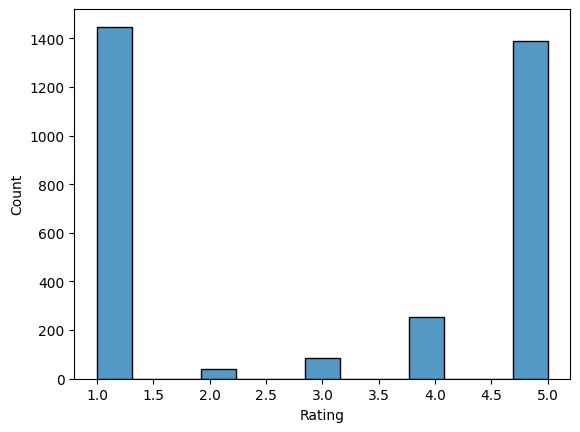

In [8]:
sns.histplot(data['Rating'])
plt.show()

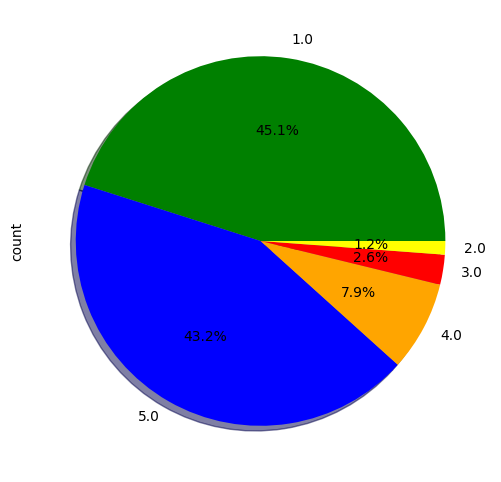

In [9]:
plt.figure(figsize=(10,6))
colors=['green','blue','orange','red','yellow']
data['Rating'].value_counts().plot(kind='pie',autopct='%1.1f%%',shadow=True,colors=colors)
plt.show()

In [10]:
data[data['Review_body'].isna()==True]

,Rating,Review_title,Review_body


array([[<Axes: title={'center': 'Rating'}>]], dtype=object)

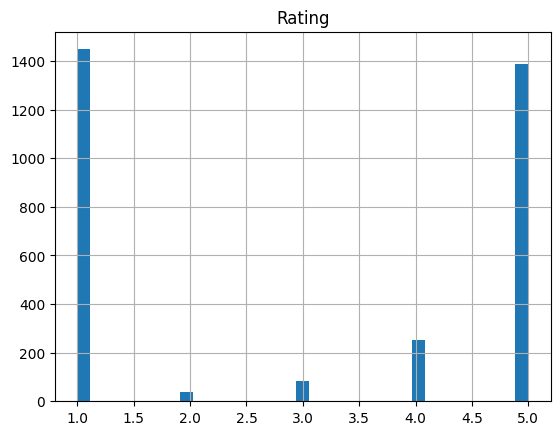

In [11]:
data.hist(bins=35)

In [12]:
data['len']=data['Review_body'].apply(len)
data.head(400)


,Rating,Review_title,Review_body,len
0,1.0,Worthless,Very slow this watch. I cannot return this pro...,71
1,4.0,Nice product,Watch is good only i feel that sound can be mo...,55
2,5.0,Best in the market!,The product is very good in design....and valu...,57
3,5.0,Perfect product!,Nice,4
4,5.0,Great product,"Is so good and light weight and comfort, this ...",77
...,...,...,...,...
395,1.0,Utterly Disappointed,Very disgusting product. Dosent even turn off....,95
396,5.0,Brilliant,Good quality,12
397,1.0,Terrible product,No products,11
398,5.0,Mind-blowing purchase,Awesome product. Its having all the necessary ...,65


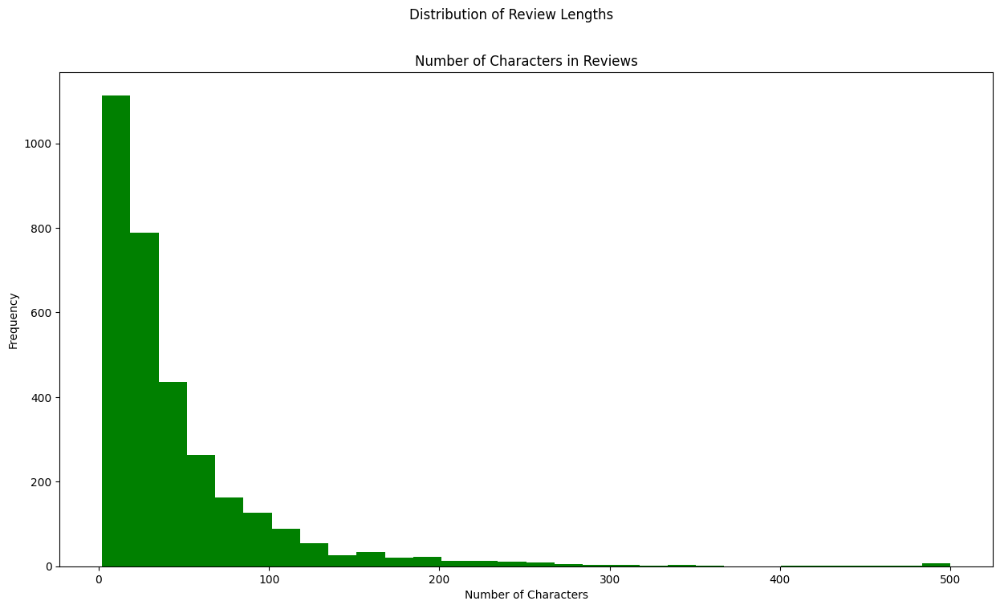

In [13]:

fig, ax = plt.subplots(figsize=(15, 8))

len_review = data['len']

ax.hist(len_review, bins=30, color='green')
ax.set_title('Number of Characters in Reviews')
ax.set_xlabel('Number of Characters')
ax.set_ylabel('Frequency')

# Set the main title
fig.suptitle('Distribution of Review Lengths')

# Display the plot
plt.show()


In [14]:
# Combining of Two columns
data['Reviews']=data['Review_title']+" | "+ data['Review_body']
data.head(10)

,Rating,Review_title,Review_body,len,Reviews
0,1.0,Worthless,Very slow this watch. I cannot return this pro...,71,Worthless | Very slow this watch. I cannot ret...
1,4.0,Nice product,Watch is good only i feel that sound can be mo...,55,Nice product | Watch is good only i feel that ...
2,5.0,Best in the market!,The product is very good in design....and valu...,57,Best in the market! | The product is very good...
3,5.0,Perfect product!,Nice,4,Perfect product! | Nice
4,5.0,Great product,"Is so good and light weight and comfort, this ...",77,Great product | Is so good and light weight an...
5,4.0,Value-for-money,"Product is nice, easy to use and value for money.",49,"Value-for-money | Product is nice, easy to use..."
6,1.0,Worthless,Waste product don't go for this ... No Return ...,52,Worthless | Waste product don't go for this .....
7,5.0,Terrific purchase,Nice product and best item,26,Terrific purchase | Nice product and best item
8,1.0,Absolute rubbish!,Button... Not working am buying 2pc..same prob...,73,Absolute rubbish! | Button... Not working am b...
9,5.0,Awesome,Amazing product 🤠 loved it . The watch have pr...,67,Awesome | Amazing product 🤠 loved it . The wat...


In [15]:
#punctuatiin check
from string import punctuation

data['punctuation_count']=data['Reviews'].apply(lambda x:sum(char in punctuation for char in x))
data[['Reviews','punctuation_count']]

,Reviews,punctuation_count
0,Worthless | Very slow this watch. I cannot ret...,3
1,Nice product | Watch is good only i feel that ...,1
2,Best in the market! | The product is very good...,6
3,Perfect product! | Nice,2
4,Great product | Is so good and light weight an...,2
...,...,...
3206,Hated it! | Battery problam,2
3207,Not recommended at all | Charging points defect,1
3208,Hated it! | Broken only one fall from bed. Ver...,3
3209,Worthless | My watch is not working also not o...,1


In [16]:
!pip install emoji

In [17]:
#emojis check

import emoji

data['emoji_count'] = data['Reviews'].apply(lambda x: sum(1 for char in x if char in emoji.EMOJI_DATA))
data[['Reviews','emoji_count']].tail(30)

,Reviews,emoji_count
3181,Worst experience ever! | Poor disply,0
3182,Super! | Thanks to new replacement my watch ⌚....,1
3183,Absolute rubbish! | The experience is not that...,0
3184,Hated it! | Watch was dead after 3days and not...,0
3185,Very poor | Very bad product,0
3186,Terrific purchase | Good 👍,1
3187,Terrific | Good,0
3188,"Hated it! | Very worst product, Activity track...",0
3189,Mind-blowing purchase | It's ok nd looking so ...,1
3190,Terrific purchase | Very nice watch value of m...,0


In [18]:
# uppercase check

data['uppercase_count']=data['Reviews'].apply(lambda x:sum(char.isupper()for char in x))
data[['Reviews','uppercase_count']].value_counts()

Reviews                                                           uppercase_count
Delightful | Good                                                 2                  3
Wonderful | Good product                                          2                  3
Good quality product | Good product                               2                  3
Great product | Very nice                                         2                  2
Wonderful | Good                                                  2                  2
                                                                                    ..
Hated it! | Wast product                                          2                  1
Hated it! | Wast watch sound problem no comming sound in speaker  2                  1
Hated it! | Waste of money                                        2                  1
Hated it! | Watch good but charge is not working                  2                  1
very bad | prodect is very bad                  

In [19]:
#numerics check
import re
# Function to find numeric values in a review
find_numeric=lambda x:re.findall(r'\d+',x)
#Apply the lambda function to find numeric values in each review
data['numeric_values']=data['Reviews'].apply(find_numeric)
#count the numeric values
data['numeric_count']=data['numeric_values'].apply(len)
data[['Reviews','numeric_count']].value_counts()

Reviews                                                           numeric_count
Delightful | Good                                                 0                3
Wonderful | Good product                                          0                3
Good quality product | Good product                               0                3
Great product | Very nice                                         0                2
Wonderful | Good                                                  0                2
                                                                                  ..
Hated it! | Wast product                                          0                1
Hated it! | Wast watch sound problem no comming sound in speaker  0                1
Hated it! | Waste of money                                        0                1
Hated it! | Watch good but charge is not working                  0                1
very bad | prodect is very bad                                    0   

In [20]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [21]:
# stopwords check

from nltk.corpus import stopwords

# Assuming df is your DataFrame containing the 'Review' column
stop_words = set(stopwords.words('english'))
data['stopword_count'] = data['Reviews'].apply(lambda x: sum(word in stop_words for word in x.lower().split()))
data[['Reviews', 'stopword_count']]

,Reviews,stopword_count
0,Worthless | Very slow this watch. I cannot ret...,6
1,Nice product | Watch is good only i feel that ...,7
2,Best in the market! | The product is very good...,7
3,Perfect product! | Nice,0
4,Great product | Is so good and light weight an...,6
...,...,...
3206,Hated it! | Battery problam,0
3207,Not recommended at all | Charging points defect,3
3208,Hated it! | Broken only one fall from bed. Ver...,3
3209,Worthless | My watch is not working also not o...,6


In [22]:
# Function to find URLs in a review


find_link = lambda x: re.findall(r'http[s]?://\S+', x)

# Apply the lambda function to find URLs in each review
data['link_values'] = data['Reviews'].apply(find_link)

# Count the URLs
data['link_count'] = data['link_values'].apply(len)

data_with_links = data[data['link_count'] > 0]

# Display the filtered rows
print(data_with_links[['Reviews', 'link_count']])

Empty DataFrame
Columns: [Reviews, link_count]
Index: []


## Insights

*  no links present
*  puctuations are present
*  numerics are present
*  emojis are present






#**Text Extraction**

**cleaning emojis ,Remove unessasry spaces & symbols ,punctuations**

In [23]:
data.head()

,Rating,Review_title,Review_body,len,Reviews,punctuation_count,emoji_count,uppercase_count,numeric_values,numeric_count,stopword_count,link_values,link_count
0,1.0,Worthless,Very slow this watch. I cannot return this pro...,71,Worthless | Very slow this watch. I cannot ret...,3,0,4,[],0,6,[],0
1,4.0,Nice product,Watch is good only i feel that sound can be mo...,55,Nice product | Watch is good only i feel that ...,1,0,2,[],0,7,[],0
2,5.0,Best in the market!,The product is very good in design....and valu...,57,Best in the market! | The product is very good...,6,0,2,[],0,7,[],0
3,5.0,Perfect product!,Nice,4,Perfect product! | Nice,2,0,2,[],0,0,[],0
4,5.0,Great product,"Is so good and light weight and comfort, this ...",77,Great product | Is so good and light weight an...,2,0,2,[],0,6,[],0


In [24]:
import re
import string

In [25]:

def clean_text1(text):
    # Remove emojis
    emoji_pattern = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
        u"\U00002500-\U00002BEF"  # chinese char
        u"\U00002702-\U000027B0"
        u"\U000024C2-\U0001F251"
        u"\U0001f926-\U0001f937"
        u"\U00010000-\U0010ffff"
        u"\u2640-\u2642"
        u"\u2600-\u2B55"
        u"\u200d"
        u"\u23cf"
        u"\u23e9"
        u"\u231a"
        u"\ufe0f"  # dingbats
        u"\u3030"
        u"\U0001F920"
                      "]+", re.UNICODE)
    text = emoji_pattern.sub(r'', text)


    # Remove punctuation except for '|'
    punctuation = string.punctuation.replace('|', '')
    text = text.translate(str.maketrans('', '', punctuation))

    # Remove unnecessary spaces
    text = re.sub(r'\s+', ' ', text).strip()

    return text



In [26]:
# Testing the usage


sample_text = "Hello 😊! || This is a test text. 🤠..!@##$%%^&**())+!@#$%^&*=-?></.,'; with multiple spaces, emojis 😜, and punctuation!!! Also, keep | this | symbol."
cleaned_text = clean_text1(sample_text)
print(cleaned_text)


Hello || This is a test text with multiple spaces emojis and punctuation Also keep | this | symbol


In [27]:
data['reviews_cleaned'] = data['Reviews'].apply(clean_text1)

In [28]:
data['reviews_cleaned'][9]

'Awesome | Amazing product loved it The watch have pretty solid features'

In [29]:
data['Reviews'][2305]

'Wonderful | Very nice product 😊👍😊👍😊😊😊😊👍😊😊👍👍😊👍👍😊👍👍😊😊👍👍😊👍😊😊😊😊👍'

In [30]:
data['reviews_cleaned'][2305]

'Wonderful | Very nice product'

In [31]:
pd.set_option('display.max_rows', None)  # None means unlimited
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)
data['reviews_cleaned']

0                                                                                                                                                                                                                                                                                                                                                                                                                                                                      Worthless | Very slow this watch I cannot return this product Very bad this watch
1                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

In [32]:
pd.set_option('display.max_rows', None)  # None means unlimited
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)
data['Reviews']

0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  Worthless | Very slow this watch. I cannot return this product. Very bad this watch
1                                                                                                                                                                                                                                                                                                                                                                                                                                                                

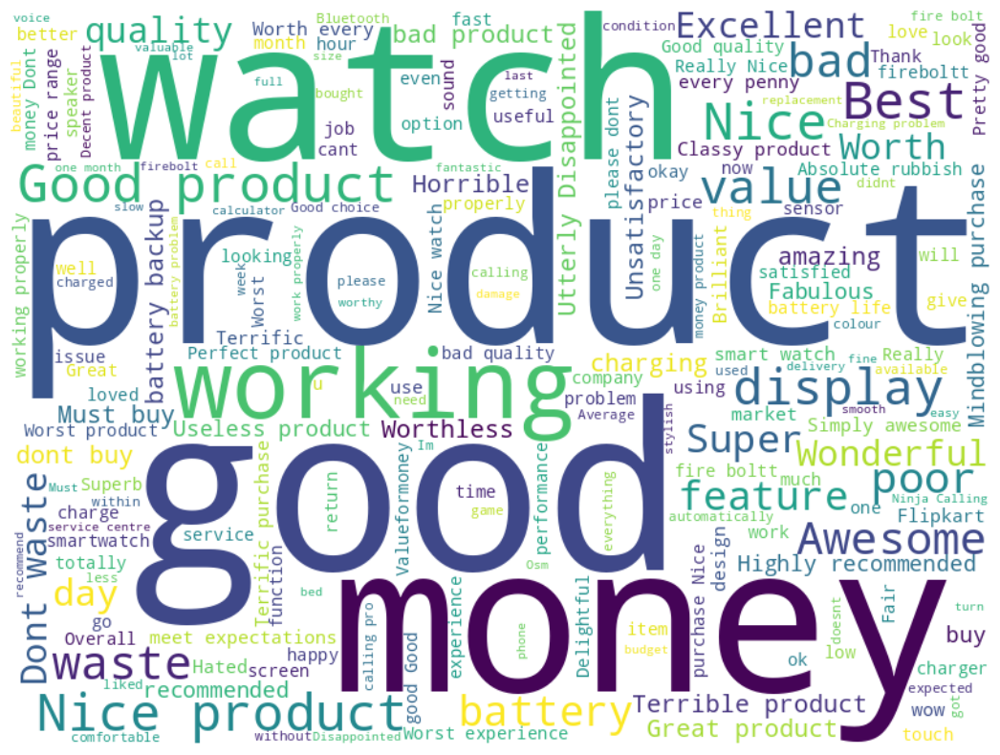

In [33]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Concatenate all reviews into a single string
all_reviews = " ".join(data['reviews_cleaned'].astype(str))


wordcloud = WordCloud(width=800, height=600, background_color='white').generate(all_reviews)

# Display the word cloud
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


             word  tfidf_score
1359      product   342.176452
820          good   283.214329
1154         nice   211.149798
1110        money   160.142385
1952        watch   146.276328
202           bad   122.605141
196       awesome   100.879462
1947        waste    97.240877
330           buy    90.407696
1428      quality    89.710960
231       battery    89.565668
2010      working    89.401289
255          best    86.327355
1883        value    80.236197
1416     purchase    79.138923
2034        worth    78.132847
604          dont    76.592749
1770     terrific    73.867804
1471  recommended    72.701003
1735        super    71.871152


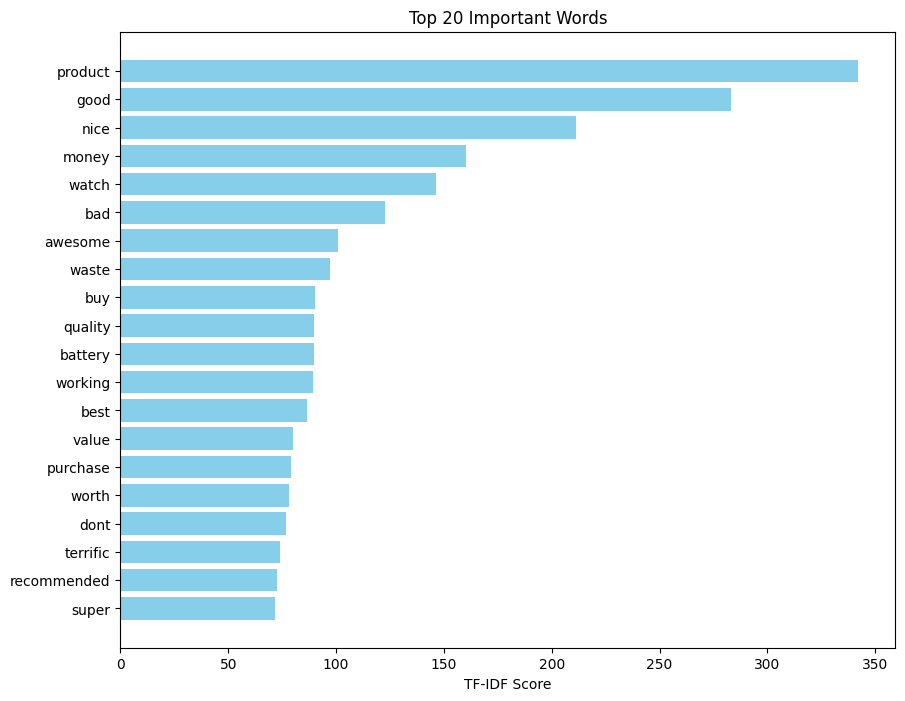

In [34]:
#finding out important words

from sklearn.feature_extraction.text import TfidfVectorizer

# Initialize the TF-IDF Vectorizer
vectorizer = TfidfVectorizer(stop_words='english')

# Fit and transform the data
tfidf_matrix = vectorizer.fit_transform(data['reviews_cleaned'])

# Get the feature names (i.e., words)
feature_names = vectorizer.get_feature_names_out()

# Sum the TF-IDF scores for each word
tfidf_scores = tfidf_matrix.sum(axis=0).A1

# Create a DataFrame with words and their corresponding TF-IDF scores
tfidf_df = pd.DataFrame({'word': feature_names, 'tfidf_score': tfidf_scores})

# Sort the DataFrame by TF-IDF score in descending order
tfidf_df = tfidf_df.sort_values(by='tfidf_score', ascending=False)

# Display the top 20 words
print(tfidf_df.head(20))

# Optionally, you can plot the top words
import matplotlib.pyplot as plt

# Plot the top 20 words
plt.figure(figsize=(10, 8))
plt.barh(tfidf_df.head(20)['word'], tfidf_df.head(20)['tfidf_score'], color='skyblue')
plt.gca().invert_yaxis()
plt.xlabel('TF-IDF Score')
plt.title('Top 20 Important Words')
plt.show()


In [35]:

import spacy
from spacy.lang.en.stop_words import STOP_WORDS

print(len(STOP_WORDS))
print(STOP_WORDS)

326
{'‘ll', 'per', 'sixty', 'was', 'herself', 'least', 'so', 'bottom', 'or', 'eleven', 'onto', 'whatever', "n't", 'who', 'within', 'another', 'above', 'however', 'most', 'no', 'next', 'without', 'yours', 'since', 'before', 'less', 'anyway', 'will', 'were', 'anything', 'too', 'among', 'once', '’s', 'amount', 'thru', 'using', 'is', 'whom', 'rather', 'being', 'for', 'mine', 'while', 'two', 'twenty', 'latter', 'us', 'serious', 'she', 'him', '‘re', 'whereafter', 'beforehand', 'thereupon', 'few', 'amongst', 'not', 'in', 'behind', 'anyone', 'more', 'then', 'its', 'full', 'about', 'because', 'call', 'nothing', 'whereupon', 'he', 'an', '’ll', 'that', 'some', 'after', '‘d', 'hereby', 'please', "'s", 'my', 'besides', 'everywhere', 'make', 'one', 'alone', 'everything', 'moreover', 'somewhere', 'than', 'me', 'same', 'can', 'our', 'but', 'see', 'just', 'must', 'noone', 'thereafter', 'elsewhere', 'ourselves', 'further', 'former', 'cannot', 'are', 'does', 'seeming', 'herein', 'almost', 'why', 'themsel

# **Preprocessing**

In [36]:
data.head()


,Rating,Review_title,Review_body,len,Reviews,punctuation_count,emoji_count,uppercase_count,numeric_values,numeric_count,stopword_count,link_values,link_count,reviews_cleaned
0,1.0,Worthless,Very slow this watch. I cannot return this product. Very bad this watch,71,Worthless | Very slow this watch. I cannot return this product. Very bad this watch,3,0,4,[],0,6,[],0,Worthless | Very slow this watch I cannot return this product Very bad this watch
1,4.0,Nice product,Watch is good only i feel that sound can be more better,55,Nice product | Watch is good only i feel that sound can be more better,1,0,2,[],0,7,[],0,Nice product | Watch is good only i feel that sound can be more better
2,5.0,Best in the market!,The product is very good in design....and value of money,57,Best in the market! | The product is very good in design....and value of money,6,0,2,[],0,7,[],0,Best in the market | The product is very good in designand value of money
3,5.0,Perfect product!,Nice,4,Perfect product! | Nice,2,0,2,[],0,0,[],0,Perfect product | Nice
4,5.0,Great product,"Is so good and light weight and comfort, this smart watch so amazing features",77,"Great product | Is so good and light weight and comfort, this smart watch so amazing features",2,0,2,[],0,6,[],0,Great product | Is so good and light weight and comfort this smart watch so amazing features


##lemmatization and tokenization

In [37]:
import nltk
nltk.download('punkt')
nltk.download('wordnet')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [38]:
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

def preprocess_text(review):

    lemmatizer = WordNetLemmatizer()
    tokens = word_tokenize(review)

    # Lowercase the tokens and lemmatize them
    processed_tokens = [lemmatizer.lemmatize(token.lower()) for token in tokens]

    return " ".join(processed_tokens)

# Example usage
review = "The quick brown foxes are jumping over the lazy dogs."
processed_review = preprocess_text(review)
print(processed_review)


the quick brown fox are jumping over the lazy dog .


In [39]:
# Apply the preprocessing function to the 'cleaned_review' column
data['processed_review'] = data['reviews_cleaned'].apply(preprocess_text)

# Display the processed reviews
print(data[['reviews_cleaned', 'processed_review']].head())
data[['reviews_cleaned', 'processed_review']].head().head()

                                                                                reviews_cleaned  \
0             Worthless | Very slow this watch I cannot return this product Very bad this watch   
1                        Nice product | Watch is good only i feel that sound can be more better   
2                     Best in the market | The product is very good in designand value of money   
3                                                                        Perfect product | Nice   
4  Great product | Is so good and light weight and comfort this smart watch so amazing features   

                                                                              processed_review  
0           worthless | very slow this watch i can not return this product very bad this watch  
1                       nice product | watch is good only i feel that sound can be more better  
2                    best in the market | the product is very good in designand value of money  
3                

,reviews_cleaned,processed_review
0,Worthless | Very slow this watch I cannot return this product Very bad this watch,worthless | very slow this watch i can not return this product very bad this watch
1,Nice product | Watch is good only i feel that sound can be more better,nice product | watch is good only i feel that sound can be more better
2,Best in the market | The product is very good in designand value of money,best in the market | the product is very good in designand value of money
3,Perfect product | Nice,perfect product | nice
4,Great product | Is so good and light weight and comfort this smart watch so amazing features,great product | is so good and light weight and comfort this smart watch so amazing feature


# **Sentimental analysis**

In [40]:
from textblob import TextBlob

def analyze_sentiment(review):

    analysis = TextBlob(review)
    return analysis.sentiment.polarity, analysis.sentiment.subjectivity

def get_sentiment(score):

    if score > 0:
        return 'positive'
    elif score < 0:
        return 'negative'
    else:
        return 'neutral'

# Example usage
review = "Highly recommended | Amazing watch my son is very happy and price willnbe very budgeting"
polarity, subjectivity = analyze_sentiment(review)
sentiment = get_sentiment(polarity)

print(f"Review: {review}")
print(f"Polarity: {polarity:.2f}")
print(f"Subjectivity: {subjectivity:.2f}")
print(f"Sentiment: {sentiment}")


Review: Highly recommended | Amazing watch my son is very happy and price willnbe very budgeting
Polarity: 0.49
Subjectivity: 0.68
Sentiment: positive


In [41]:
# Apply sentiment analysis to 'cleaned_review' column
data['sentiment'] = data['processed_review'].apply(lambda x: analyze_sentiment(x))

# Separate polarity and subjectivity into separate columns
data[['polarity', 'subjectivity']] = pd.DataFrame(data['sentiment'].tolist(), index=data.index)

# Display the DataFrame with sentiment analysis results
print(data[['processed_review', 'polarity', 'subjectivity']].head())

                                                                              processed_review  \
0           worthless | very slow this watch i can not return this product very bad this watch   
1                       nice product | watch is good only i feel that sound can be more better   
2                    best in the market | the product is very good in designand value of money   
3                                                                       perfect product | nice   
4  great product | is so good and light weight and comfort this smart watch so amazing feature   

   polarity  subjectivity  
0 -0.700000      0.762222  
1  0.450000      0.666667  
2  0.955000      0.540000  
3  0.800000      1.000000  
4  0.542857      0.718571  


In [42]:
data['sentiment_label'] = data['polarity'].apply(get_sentiment)

In [43]:
# Display the DataFrame with sentiment labels

df=pd.DataFrame(data[['polarity', 'sentiment_label','Rating','reviews_cleaned']], index=data.index)
df

,polarity,sentiment_label,Rating,reviews_cleaned
0,-7.000000e-01,negative,1.0,Worthless | Very slow this watch I cannot return this product Very bad this watch
1,4.500000e-01,positive,4.0,Nice product | Watch is good only i feel that sound can be more better
2,9.550000e-01,positive,5.0,Best in the market | The product is very good in designand value of money
3,8.000000e-01,positive,5.0,Perfect product | Nice
4,5.428571e-01,positive,5.0,Great product | Is so good and light weight and comfort this smart watch so amazing features
5,5.166667e-01,positive,4.0,Valueformoney | Product is nice easy to use and value for money
6,-5.000000e-01,negative,1.0,Worthless | Waste product dont go for this No Return option
7,5.333333e-01,positive,5.0,Terrific purchase | Nice product and best item
8,1.000000e-01,positive,1.0,Absolute rubbish | Button Not working am buying 2pcsame problem using after 10days only
9,5.100000e-01,positive,5.0,Awesome | Amazing product loved it The watch have pretty solid features


In [44]:
# Filter rows where sentiment is 'positive' and rating is 5.0
filtered_df1 =pd.DataFrame(df[(df['sentiment_label'] == 'positive')])

# Display the filtered DataFrame
filtered_df1.shape

(1929, 4)

In [45]:
# Filter rows where sentiment is 'positive' and rating is 5.0
filtered_df2 =pd.DataFrame(df[(df['sentiment_label'] == 'negative')])

# Display the filtered DataFrame
filtered_df2.shape

(1152, 4)

In [46]:
# Filter rows where sentiment is 'positive' and rating is 5.0
filtered_df3 =pd.DataFrame(df[(df['sentiment_label'] == 'neutral')])

# Display the filtered DataFrame
filtered_df3.shape

(130, 4)

In [47]:
df.shape

(3211, 4)

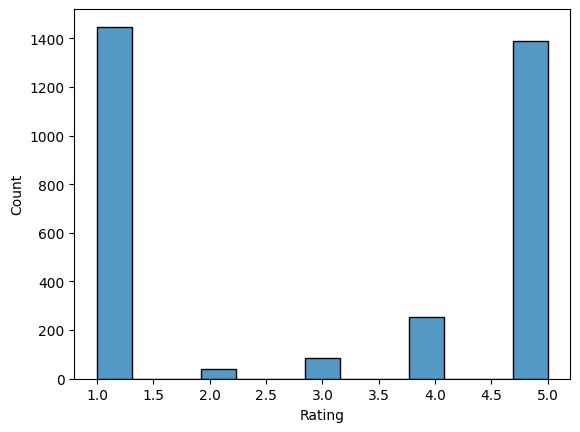

In [48]:
sns.histplot(data['Rating'])
plt.show()

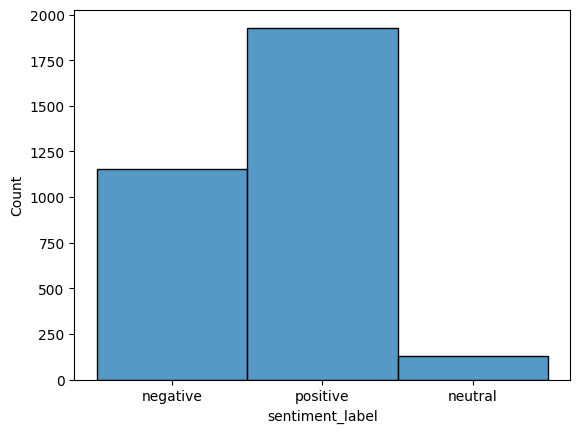

In [49]:
sns.histplot(data['sentiment_label'])
plt.show()

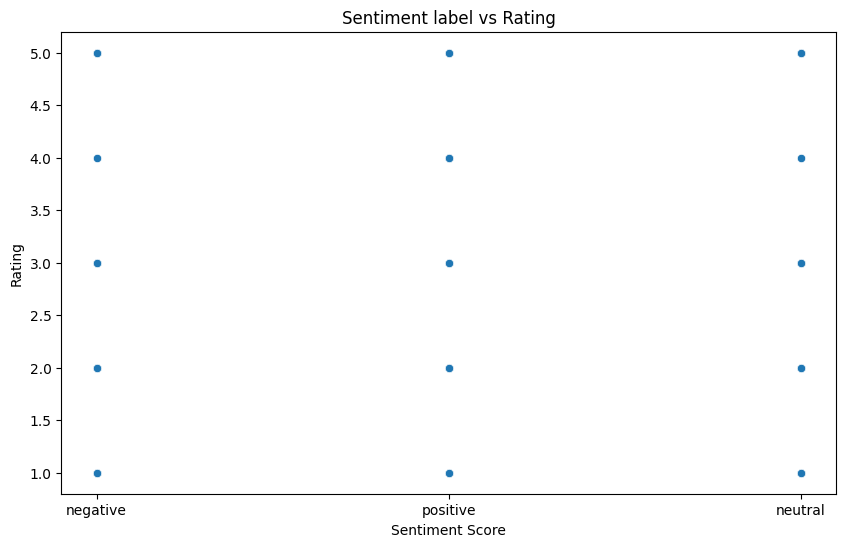

In [50]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='sentiment_label', y='Rating', data=df)
plt.title('Sentiment label vs Rating')
plt.xlabel('Sentiment Score')
plt.ylabel('Rating')
plt.show()

In [51]:
df.groupby('sentiment_label')['Rating'].mean()

sentiment_label
negative    1.052951
neutral     1.723077
positive    4.298082
Name: Rating, dtype: float64

In [52]:
def get_sentiment_2(score):

    if score > 0:
        return '2'
    elif score < 0:
        return '0'
    else:
        return '1'

# Apply the classification function
df['newlabelaccordingtopolarity'] = df['polarity'].apply(get_sentiment_2)

# Display the first few rows of the updated dataframe
df.head()

,polarity,sentiment_label,Rating,reviews_cleaned,newlabelaccordingtopolarity
0,-0.700000,negative,1.0,Worthless | Very slow this watch I cannot return this product Very bad this watch,0
1,0.450000,positive,4.0,Nice product | Watch is good only i feel that sound can be more better,2
2,0.955000,positive,5.0,Best in the market | The product is very good in designand value of money,2
3,0.800000,positive,5.0,Perfect product | Nice,2
4,0.542857,positive,5.0,Great product | Is so good and light weight and comfort this smart watch so amazing features,2


In [63]:
from sklearn.preprocessing import LabelEncoder
encoder=LabelEncoder()

In [64]:
df['target']=encoder.fit_transform(df['sentiment_label'])
df

,polarity,sentiment_label,Rating,reviews_cleaned,newlabelaccordingtopolarity,target
0,-7.000000e-01,negative,1.0,Worthless | Very slow this watch I cannot return this product Very bad this watch,0,0
1,4.500000e-01,positive,4.0,Nice product | Watch is good only i feel that sound can be more better,2,2
2,9.550000e-01,positive,5.0,Best in the market | The product is very good in designand value of money,2,2
3,8.000000e-01,positive,5.0,Perfect product | Nice,2,2
4,5.428571e-01,positive,5.0,Great product | Is so good and light weight and comfort this smart watch so amazing features,2,2
5,5.166667e-01,positive,4.0,Valueformoney | Product is nice easy to use and value for money,2,2
6,-5.000000e-01,negative,1.0,Worthless | Waste product dont go for this No Return option,0,0
7,5.333333e-01,positive,5.0,Terrific purchase | Nice product and best item,2,2
8,1.000000e-01,positive,1.0,Absolute rubbish | Button Not working am buying 2pcsame problem using after 10days only,2,2
9,5.100000e-01,positive,5.0,Awesome | Amazing product loved it The watch have pretty solid features,2,2


In [65]:
df[['Rating','target']].corr()

,Rating,target
Rating,1.000000,0.814343
target,0.814343,1.000000


<Axes: >

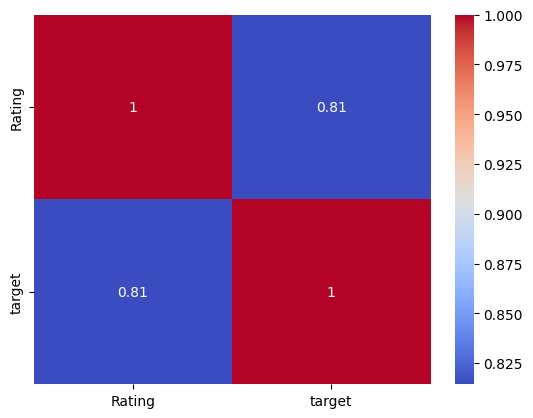

In [66]:
sns.heatmap(df[['Rating','target']].corr(),annot=True,cmap='coolwarm')

### **find out that the polarity and ratings are 81% correlated**

In [67]:
#there for our final df is this

df.head(20)

,polarity,sentiment_label,Rating,reviews_cleaned,newlabelaccordingtopolarity,target
0,-0.700000,negative,1.0,Worthless | Very slow this watch I cannot return this product Very bad this watch,0,0
1,0.450000,positive,4.0,Nice product | Watch is good only i feel that sound can be more better,2,2
2,0.955000,positive,5.0,Best in the market | The product is very good in designand value of money,2,2
3,0.800000,positive,5.0,Perfect product | Nice,2,2
4,0.542857,positive,5.0,Great product | Is so good and light weight and comfort this smart watch so amazing features,2,2
5,0.516667,positive,4.0,Valueformoney | Product is nice easy to use and value for money,2,2
6,-0.500000,negative,1.0,Worthless | Waste product dont go for this No Return option,0,0
7,0.533333,positive,5.0,Terrific purchase | Nice product and best item,2,2
8,0.100000,positive,1.0,Absolute rubbish | Button Not working am buying 2pcsame problem using after 10days only,2,2
9,0.510000,positive,5.0,Awesome | Amazing product loved it The watch have pretty solid features,2,2


# **Feature Engineering**

In [68]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import nltk
from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import WordCloud,STOPWORDS
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
import re,string,unicodedata
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score,f1_score
from sklearn.model_selection import train_test_split
from string import punctuation
from nltk import pos_tag
from nltk.corpus import wordnet
import re
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt

In [69]:
# lemmatization of word
class LemmaTokenizer(object):
    def __init__(self):
        self.wordnetlemma = WordNetLemmatizer()
    def __call__(self, reviews):
        return [self.wordnetlemma.lemmatize(word) for word in word_tokenize(reviews)]

In [79]:
train,test=train_test_split(df,test_size=.3,random_state=42, shuffle=True)
#countvect = CountVectorizer(analyzer = "word", tokenizer = LemmaTokenizer(), ngram_range=(1,3), min_df=10,max_features=5000)
tfidfvect = TfidfVectorizer(analyzer = "word", tokenizer = LemmaTokenizer(), ngram_range=(1,3),min_df=10,max_features=10000)
#x_train_count = countvect.fit_transform(train['Reviews_clean']).toarray()
#x_test_count = countvect.transform(test['Reviews_clean']).toarray()
x_train_tfidf = tfidfvect.fit_transform(train['reviews_cleaned']).toarray()
x_test_tfidf = tfidfvect.transform(test['reviews_cleaned']).toarray()

y_train =train['target']
y_test = test['target']

In [80]:
import pickle

model_filename = 'vectorizer.pkl'

# Open a file in binary write mode ('wb') and serialize the model using pickle.dump
with open(model_filename, 'wb') as file:
    pickle.dump(tfidfvect, file)

# **Model Building**

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
cv=CountVectorizer()
vectorizer=TfidfVectorizer(max_features=10000)
x=vectorizer.fit_transform(df['Reviews'])

In [ ]:
x.shape

(3211, 2638)

### SVC

In [ ]:
y_svc=df['target'].values
y_svc

array([0, 2, 2, ..., 0, 1, 2])

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(x,y_svc,test_size=0.1,random_state=40)

In [59]:
from sklearn.svm import SVC
from sklearn import svm

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, cross_val_score


In [60]:
clf = SVC()
param_grid = [{'kernel':['rbf'],'gamma':[25,20,10,1,0.5],'C':[20,15,14,13,12,11,10,0.1,0.001] }]
gsv = GridSearchCV(clf,param_grid,cv=10)
gsv.fit(x_train_tfidf,y_train)

KeyboardInterrupt: 

In [ ]:
gsv.best_params_ , gsv.best_score_

({'C': 20, 'gamma': 0.5, 'kernel': 'rbf'}, 0.9588151191849288)

In [ ]:
clf = SVC(C= 20, gamma = 25)
clf.fit(X_train , y_train)
y_pred = clf.predict(X_test)
acc = accuracy_score(y_test, y_pred) * 100
print("Accuracy =", acc)
confusion_matrix(y_test, y_pred)

Accuracy = 57.14285714285714


array([[  2,   0,  51],
       [  0,  27,  87],
       [  0,   0, 155]], dtype=int64)

### KNN

In [ ]:
from sklearn.model_selection import KFold
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
knn = KNeighborsClassifier()
from sklearn.model_selection import GridSearchCV
k_range = list(range(1, 31))
param_grid = dict(n_neighbors=k_range)

# defining parameter range
grid = GridSearchCV(knn, param_grid, cv=10, scoring='accuracy', return_train_score=False,verbose=1)

# fitting the model for grid search
grid_search=grid.fit(X_train, y_train)

Fitting 10 folds for each of 30 candidates, totalling 300 fits


In [ ]:
print(grid_search.best_params_)

{'n_neighbors': 8}


In [ ]:
accuracy = grid_search.best_score_ *100
print("Accuracy for our training dataset with tuning is : {:.2f}%".format(accuracy) )

Accuracy for our training dataset with tuning is : 78.19%


In [ ]:
#Create KNN Classifier
knn = KNeighborsClassifier(n_neighbors=7)

In [ ]:
#Train the model using the training sets
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=7)

In [ ]:
#Predict the response for test dataset
y_pred = knn.predict(X_test)

In [ ]:
#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred)*100)

Accuracy: 77.01863354037268


### Bagging Boosting

In [ ]:
from sklearn.tree import  DecisionTreeClassifier
from sklearn.metrics import accuracy_score#importing metrics for accuracy calculation (confusion matrix)
from sklearn.ensemble import BaggingClassifier#bagging combines the results of multipls models to get a generalized result.
from sklearn.ensemble import AdaBoostClassifier #boosting method attempts to correct the errors of previous models.
from sklearn.metrics import classification_report, confusion_matrix

In [ ]:
dcmodel =  BaggingClassifier(DecisionTreeClassifier(max_depth = 6), random_state=0) #decision tree classifier object
dcmodel =  AdaBoostClassifier(DecisionTreeClassifier(max_depth = 6), random_state=0) #decision tree classifier object


In [ ]:
dcmodel = dcmodel.fit(X_train,y_train) #train decision tree
y_predict = dcmodel.predict(X_test)

C:\Users\Amita\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


In [ ]:
print("Accuracy : ", accuracy_score(y_test,y_predict)*100 )

Accuracy :  94.40993788819875


### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report


In [ ]:
rf = RandomForestClassifier(n_jobs=3,oob_score=True,n_estimators=15,criterion="entropy")

In [ ]:
pip install --upgrade scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [ ]:
rf.fit(X_train,y_train) # Fitting RandomForestClassifier model from sklearn.ensemble
rf.estimators_ #
rf.classes_ # class labels (output)
rf.n_classes_ # Number of levels in class labels
rf.n_features_in_ # Number of input features in model 8 here.

rf.n_outputs_ # Number of outputs when fit performed

rf.oob_score_

C:\Users\Amita\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:615: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(


0.9068881966078228

In [ ]:
rf.predict(X_test)

array([1, 2, 2, 0, 2, 2, 2, 2, 2, 1, 0, 2, 1, 2, 1, 2, 1, 1, 1, 1, 1, 2,
       2, 0, 2, 1, 2, 2, 1, 2, 1, 2, 0, 2, 2, 1, 2, 2, 2, 0, 1, 1, 0, 2,
       1, 1, 1, 2, 0, 1, 2, 1, 2, 1, 1, 1, 2, 2, 0, 2, 2, 1, 1, 2, 2, 2,
       1, 2, 2, 1, 2, 2, 2, 2, 1, 2, 0, 1, 0, 2, 2, 0, 1, 2, 1, 0, 2, 0,
       2, 2, 1, 1, 2, 2, 2, 2, 2, 1, 1, 2, 0, 2, 2, 2, 2, 2, 2, 0, 1, 1,
       1, 2, 2, 1, 1, 2, 2, 2, 1, 2, 1, 0, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1,
       0, 2, 2, 2, 2, 2, 1, 1, 1, 2, 1, 0, 0, 1, 2, 1, 0, 1, 1, 1, 2, 1,
       2, 1, 1, 2, 0, 2, 2, 0, 1, 0, 1, 1, 1, 2, 2, 2, 2, 1, 2, 2, 1, 2,
       2, 2, 1, 2, 2, 1, 2, 1, 0, 1, 2, 2, 1, 1, 0, 2, 2, 1, 0, 2, 1, 1,
       2, 1, 2, 1, 2, 1, 0, 1, 2, 1, 2, 0, 2, 1, 1, 2, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 2, 0, 2, 0, 1, 0, 1, 1, 1, 1, 2, 1, 0, 2, 2, 0, 0,
       2, 0, 0, 1, 1, 1, 2, 1, 1, 1, 2, 2, 2, 1, 1, 2, 2, 1, 2, 1, 2, 0,
       1, 2, 2, 1, 0, 2, 0, 0, 2, 1, 2, 0, 2, 1, 1, 2, 2, 2, 0, 2, 2, 2,
       2, 2, 2, 0, 1, 2, 2, 2, 0, 2, 0, 1, 2, 0, 1,

In [ ]:
preds = rf.predict(X_test)
pd.Series(preds).value_counts()

2    154
1    121
0     47
dtype: int64

In [ ]:
preds

array([1, 2, 2, 0, 2, 2, 2, 2, 2, 1, 0, 2, 1, 2, 1, 2, 1, 1, 1, 1, 1, 2,
       2, 0, 2, 1, 2, 2, 1, 2, 1, 2, 0, 2, 2, 1, 2, 2, 2, 0, 1, 1, 0, 2,
       1, 1, 1, 2, 0, 1, 2, 1, 2, 1, 1, 1, 2, 2, 0, 2, 2, 1, 1, 2, 2, 2,
       1, 2, 2, 1, 2, 2, 2, 2, 1, 2, 0, 1, 0, 2, 2, 0, 1, 2, 1, 0, 2, 0,
       2, 2, 1, 1, 2, 2, 2, 2, 2, 1, 1, 2, 0, 2, 2, 2, 2, 2, 2, 0, 1, 1,
       1, 2, 2, 1, 1, 2, 2, 2, 1, 2, 1, 0, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1,
       0, 2, 2, 2, 2, 2, 1, 1, 1, 2, 1, 0, 0, 1, 2, 1, 0, 1, 1, 1, 2, 1,
       2, 1, 1, 2, 0, 2, 2, 0, 1, 0, 1, 1, 1, 2, 2, 2, 2, 1, 2, 2, 1, 2,
       2, 2, 1, 2, 2, 1, 2, 1, 0, 1, 2, 2, 1, 1, 0, 2, 2, 1, 0, 2, 1, 1,
       2, 1, 2, 1, 2, 1, 0, 1, 2, 1, 2, 0, 2, 1, 1, 2, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 2, 0, 2, 0, 1, 0, 1, 1, 1, 1, 2, 1, 0, 2, 2, 0, 0,
       2, 0, 0, 1, 1, 1, 2, 1, 1, 1, 2, 2, 2, 1, 1, 2, 2, 1, 2, 1, 2, 0,
       1, 2, 2, 1, 0, 2, 0, 0, 2, 1, 2, 0, 2, 1, 1, 2, 2, 2, 0, 2, 2, 2,
       2, 2, 2, 0, 1, 2, 2, 2, 0, 2, 0, 1, 2, 0, 1,

In [ ]:
# In order to check whether the predictions are correct or wrong we will create a cross tab on y_test data

crosstable = pd.crosstab(y_test,preds)
crosstable

col_0,0,1,2
row_0,,,
0,47,5,1
1,0,109,5
2,0,7,148


In [ ]:
# Final step we will calculate the accuracy of our model

# We are comparing the predicted values with the actual values and calculating mean for the matches
np.mean(preds==y_test)

0.9440993788819876

In [ ]:
print(classification_report(preds,y_test))

              precision    recall  f1-score   support

           0       0.89      1.00      0.94        47
           1       0.96      0.90      0.93       121
           2       0.95      0.96      0.96       154

    accuracy                           0.94       322
   macro avg       0.93      0.95      0.94       322
weighted avg       0.95      0.94      0.94       322



In [ ]:
### XGBoost (Extreme Gradient Boosting)

In [65]:
pip install xgboost


In [72]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

### XGBoost

In [73]:
# fit model no training data
modelxgb = XGBClassifier()
modelxgb.fit(x_train_tfidf, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [75]:
print(modelxgb)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)


In [76]:
# make predictions for test data
y_pred = modelxgb.predict(x_test_tfidf)
predictions = [round(value) for value in y_pred]

In [77]:
# evaluate predictions
accuracy = accuracy_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 94.71%


In [81]:
y_pred

array([0, 2, 2, 1, 2, 0, 2, 0, 2, 2, 0, 0, 2, 0, 2, 0, 1, 0, 2, 0, 0, 2,
       0, 2, 2, 0, 0, 2, 2, 2, 2, 2, 0, 1, 2, 2, 2, 2, 0, 2, 0, 0, 2, 0,
       2, 0, 2, 2, 2, 2, 2, 2, 0, 2, 0, 0, 2, 0, 2, 2, 2, 0, 2, 2, 2, 0,
       2, 2, 0, 2, 2, 2, 1, 1, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2,
       0, 2, 2, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0,
       2, 0, 2, 2, 0, 0, 0, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 2,
       0, 2, 0, 2, 2, 2, 2, 2, 0, 0, 2, 0, 2, 0, 2, 2, 2, 0, 2, 2, 0, 2,
       2, 0, 0, 2, 2, 0, 2, 2, 2, 0, 0, 0, 2, 0, 2, 2, 2, 2, 0, 1, 1, 0,
       2, 2, 2, 2, 2, 0, 0, 0, 2, 0, 2, 1, 2, 2, 0, 1, 2, 0, 2, 0, 2, 2,
       2, 0, 0, 2, 0, 2, 0, 0, 0, 2, 2, 0, 2, 0, 0, 1, 0, 2, 0, 0, 2, 2,
       2, 2, 2, 2, 2, 0, 2, 2, 0, 2, 2, 2, 2, 2, 0, 0, 2, 2, 0, 1, 2, 2,
       2, 2, 2, 2, 0, 2, 2, 1, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0,
       2, 2, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 1, 2, 2, 0, 0,
       2, 2, 2, 0, 2, 2, 2, 0, 2, 2, 0, 2, 0, 2, 0,

### XGBoost giving the best result, we can use it for deployment

In [78]:
import pickle

model_filename = 'nlp_model.pkl'

# Open a file in binary write mode ('wb') and serialize the model using pickle.dump
with open(model_filename, 'wb') as file:
    pickle.dump(modelxgb, file)